# Portland housing data - exploratory data analysis
In this second notebook, we use the cleaned and filtered data produced from notebook 1. Here we explore the spatial distribution of our dataset.

So far, we worked with pandas `DataFrame` objects, to map the properties, we import the **ArcGIS API for Python**. This adds a `GeoAccessor` and spatially enables your `DataFrame` objects. As you will see in this notebook, you can then easily plot your data both as charts and as maps.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

from arcgis.gis import GIS
from arcgis.features import GeoAccessor, GeoSeriesAccessor
gis = GIS()

## Read data

In [2]:
csv_path = 'resources/houses_for_sale_filtered.csv'
prop_df = pd.read_csv(csv_path)
prop_df.head(3)

,Unnamed: 0,SALE TYPE,PROPERTY TYPE,ADDRESS,CITY,STATE,ZIP,PRICE,BEDS,BATHS,...,YEAR BUILT,DAYS ON MARKET,PRICE PER SQFT,HOA PER MONTH,STATUS,URL,SOURCE,MLS,LATITUDE,LONGITUDE
0,3,MLS Listing,Mobile/Manufactured Home,6112 SE Clatsop St,Portland,OR,97206.0,35000.0,2.0,1.0,...,1981.0,93.0,44.0,0.0,Active,http://www.redfin.com/OR/Portland/6112-SE-Clat...,RMLS,18331169,45.461282,-122.600153
1,8,For-Sale-by-Owner Listing,Single Family Residential,6901 SE Oaks Park Way Slip 32,Portland,OR,97202.0,60000.0,1.0,1.0,...,1939.0,359.0,55.0,0.0,Active,http://www.redfin.com/OR/Portland/6901-SE-Oaks...,Fizber.com,4933081,45.474369,-122.662307
2,14,For-Sale-by-Owner Listing,Mobile/Manufactured Home,11187 SW Royal Villa Dr,Portland,OR,97224.0,69950.0,2.0,2.0,...,1976.0,44.0,47.0,0.0,Active,http://www.redfin.com/OR/Portland/11187-SW-Roy...,Fizber.com,4974567,45.398486,-122.796175


In [7]:
prop_df.shape

(3624, 23)

In [8]:
prop_df.columns

Index(['Unnamed: 0', 'SALE TYPE', 'PROPERTY TYPE', 'ADDRESS', 'CITY', 'STATE',
       'ZIP', 'PRICE', 'BEDS', 'BATHS', 'LOCATION', 'SQUARE FEET', 'LOT SIZE',
       'YEAR BUILT', 'DAYS ON MARKET', 'PRICE PER SQFT', 'HOA PER MONTH',
       'STATUS', 'URL', 'SOURCE', 'MLS', 'LATITUDE', 'LONGITUDE'],
      dtype='object')

Drop redundant columns

In [3]:
try:
    prop_df.drop(columns=['Unnamed: 0'], inplace=True)
    prop_df.drop(columns=['Unnamed: 0.1'], inplace=True)
except:
    pass

## Visualize spatially
Convert to Spatially Enabled DataFrame

In [4]:
prop_sdf = pd.DataFrame.spatial.from_xy(prop_df, 'LONGITUDE','LATITUDE')
type(prop_sdf)

pandas.core.frame.DataFrame

In [ ]:
pdx_map = gis.map('Portland, OR')
pdx_map.basemap = 'streets'
pdx_map

![](/images/portland-map1.png)

In [6]:
prop_sdf.spatial.plot(map_widget=pdx_map)

True

### Explore density of properties for sale
You can render the same data using a *heatmap* renderer, which visualizes the spatial density of the properties (houses) using a heatmap.

In [ ]:
pdx_density_map = gis.map('Portland, OR')
pdx_density_map.basemap='gray'
pdx_density_map

![](/images/portland-map2.png)

In [10]:
prop_sdf.spatial.plot(map_widget=pdx_density_map, renderer_type='h')

True

There is a hotspot near downtown Portland. There are few other isolated hotspots around the downtown as well. These could be pockets of communities that are spread around a major city.

## Visualize geographic distributions of housing properties

Using different renderers such as 'class colored renderer', you can visualize and investigate if there is any spatial phenomena observable for the following columns.

 - How is **property age** spatially distributed?
 - Does **property price** drop outward from city center?
 - Does **property size** increase in suburbs?
 - hoa vs no hoa

### Visualize spatial distribution by property age

In [ ]:
pdx_age_map = gis.map("Portland, OR")
pdx_age_map.basemap = 'gray-vector'
pdx_age_map

![](/images/portland-map3.png)

In [12]:
prop_sdf.spatial.plot(map_widget = pdx_age_map, 
                      renderer_type='c', # for classs breaks renderer
                     method='esriClassifyNaturalBreaks',  # classification scheme
                     class_count=10,  # between 1900 - 2000, each decade in a class
                     col='YEAR BUILT',
                     cmap='Blues',  # matplotlib color map
                     alpha=0.7,
                     outline_color=[0,0,0,0])

True

If you notice the syntax above, it mirrors the general syntax of plotting a DataFrame as a chart. It uses the same color map and symbols of `matplotlib`. Internally, the ArcGIS API for Python converts this syntax to ArcGIS symbology and renders it on a map.

Since the colormap and symbols is that of `matplotlib`, you can collect the class breaks from the map above and use that to plot the same data as a bar chart as shown below. Combining the map and chart gives you a powerful way to interactively explore the spatial and statistical distribution of your dataset.

Text(0.5,1,'Histogram of YEAR BUILT column')

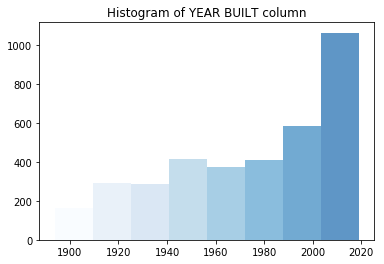

In [13]:
age_class_breaks = pdx_age_map.layers[0].layer.layerDefinition.drawingInfo.renderer.classBreakInfos
# print(len(age_class_breaks))
cbs_list = []
cmap_list = []
for cb in age_class_breaks:
#     print(cb.description)  # print the class break labels
    cbs_list.append(cb.classMaxValue)
    cmap_list.append([x/255.0 for x in cb.symbol.color])
    
# build a histogram for the same class breaks
n, bins, patches = plt.hist(prop_sdf['YEAR BUILT'], bins=cbs_list)

# apply the same color for each class to match the map
idx = 0
for c, p in zip(bins, patches):
    plt.setp(p, 'facecolor', cmap_list[idx])
    idx+=1

plt.title('Histogram of YEAR BUILT column')

### Visualize spatial distribution by price

In [ ]:
pdx_price_map = gis.map("Portland, OR")
pdx_price_map.basemap = 'gray-vector'
pdx_price_map

![](/images/portland-map4.png)

In [18]:
prop_sdf.spatial.plot(map_widget = pdx_price_map, 
                      renderer_type='c', # for classs breaks renderer
                     method='esriClassifyQuantile',  # classification scheme
                     class_count=10,  # between 1900 - 2000, each decade in a class
                     col='PRICE',
                     cmap='BuPu_r',  # matplotlib color map
                     alpha=0.5,
                     outline_color=[50,0,0,50], line_width=1)

True

Text(0.5,1,'Histogram of PRICE column')

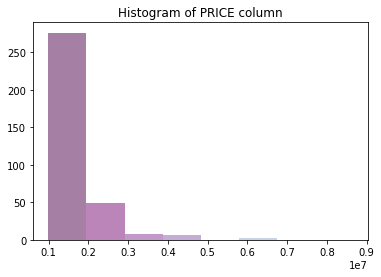

In [19]:
price_class_breaks = pdx_price_map.layers[0].layer.layerDefinition.drawingInfo.renderer.classBreakInfos
# print(len(age_class_breaks))
cbs_list = []
cmap_list = []
for cb in price_class_breaks:
#     print(cb.description)  # print the class break labels
    cbs_list.append(cb.classMaxValue)
    cmap_list.append([x/255.0 for x in cb.symbol.color])
    
# build a histogram for the same class breaks
n, bins, patches = plt.hist(prop_sdf['PRICE'], bins=cbs_list)

# apply the same color for each class to match the map
idx = 0
for c, p in zip(bins, patches):
    plt.setp(p, 'facecolor', cmap_list[idx])
    idx+=1

plt.title('Histogram of PRICE column')

### Visualize spatial distribution of property size

In [ ]:
pdx_size_map = gis.map("Portland, OR")
pdx_size_map.basemap = 'gray-vector'
pdx_size_map

![](/images/portland-map5.png)

In [21]:
prop_sdf.spatial.plot(map_widget = pdx_size_map, 
                      renderer_type='c', # for classs breaks renderer
                     method='esriClassifyNaturalBreaks',  # classification scheme
                     class_count=10,  # between 1900 - 2000, each decade in a class
                     col='SQUARE FEET',
                     cmap='RdBu',  # matplotlib color map
                     alpha=0.7,
                     outline_color=[50,0,0,50], line_width=1)

True

Text(0.5,1,'Histogram of SQUARE FEET column')

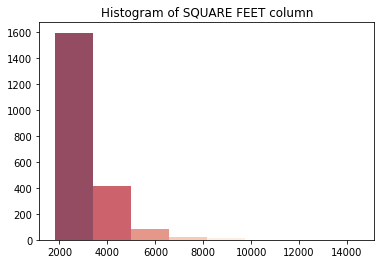

In [22]:
size_class_breaks = pdx_size_map.layers[0].layer.layerDefinition.drawingInfo.renderer.classBreakInfos
# print(len(age_class_breaks))
cbs_list = []
cmap_list = []
for cb in size_class_breaks:
#     print(cb.description)  # print the class break labels
    cbs_list.append(cb.classMaxValue)
    cmap_list.append([x/255.0 for x in cb.symbol.color])
    
# build a histogram for the same class breaks
n, bins, patches = plt.hist(prop_sdf['SQUARE FEET'], bins=cbs_list)

# apply the same color for each class to match the map
idx = 0
for c, p in zip(bins, patches):
    plt.setp(p, 'facecolor', cmap_list[idx])
    idx+=1

plt.title('Histogram of SQUARE FEET column')

### Spatial distribution of HoA

In [ ]:
pdx_hoa_map = gis.map("Portland, OR")
pdx_hoa_map.basemap = 'gray-vector'
pdx_hoa_map

![](/images/portland-map6.png)

In [42]:
#plot properties without HOA as hollow
# prop_sdf_hoa_f = prop_df[prop_df['HOA PER MONTH']==0]
# prop_sdf_hoa_f.spatial.plot(map_widget=pdx_hoa_map, symbol_type='simple',
#                             symbol_style='+',outline_color='Blues',
#                             marker_size=7)

prop_sdf_hoa_2 = prop_df[prop_df['HOA PER MONTH']>0]

prop_sdf_hoa_2.spatial.plot(map_widget = pdx_hoa_map, 
                      renderer_type='c', # for classs breaks renderer
                     method='esriClassifyQuantile',  # classification scheme
                     class_count=10,  # between 1900 - 2000, each decade in a class
                     col='HOA PER MONTH',
                     cmap='RdBu',  # matplotlib color map
                     alpha=0.7,
                     outline_color=[0,0,0,0], line_width=0)

/Users/atma6951/anaconda3/envs/geosaurus_gold/lib/python3.6/site-packages/arcgis/features/geo/_accessor.py:861: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._data[col] = self._data[col]
/Users/atma6951/anaconda3/envs/geosaurus_gold/lib/python3.6/site-packages/arcgis/features/geo/_accessor.py:1968: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._data['OBJECTID'] = list(range(1, self._data.shape[0] + 1))


True

Text(0.5,1,'Histogram of HOA PER MONTH column')

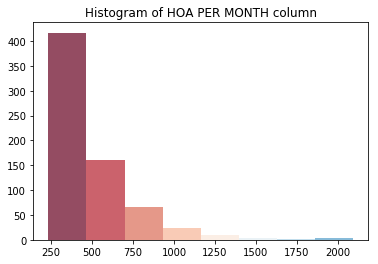

In [43]:
hoa_class_breaks = pdx_hoa_map.layers[0].layer.layerDefinition.drawingInfo.renderer.classBreakInfos
# print(len(age_class_breaks))
cbs_list = []
cmap_list = []
for cb in hoa_class_breaks:
#     print(cb.description)  # print the class break labels
    cbs_list.append(cb.classMaxValue)
    cmap_list.append([x/255.0 for x in cb.symbol.color])
    
# build a histogram for the same class breaks
n, bins, patches = plt.hist(prop_sdf['HOA PER MONTH'], bins=cbs_list)

# apply the same color for each class to match the map
idx = 0
for c, p in zip(bins, patches):
    plt.setp(p, 'facecolor', cmap_list[idx])
    idx+=1

plt.title('Histogram of HOA PER MONTH column')

![](/images/geographic_distributions.jpg)

## Explore distribution of numeric columns:

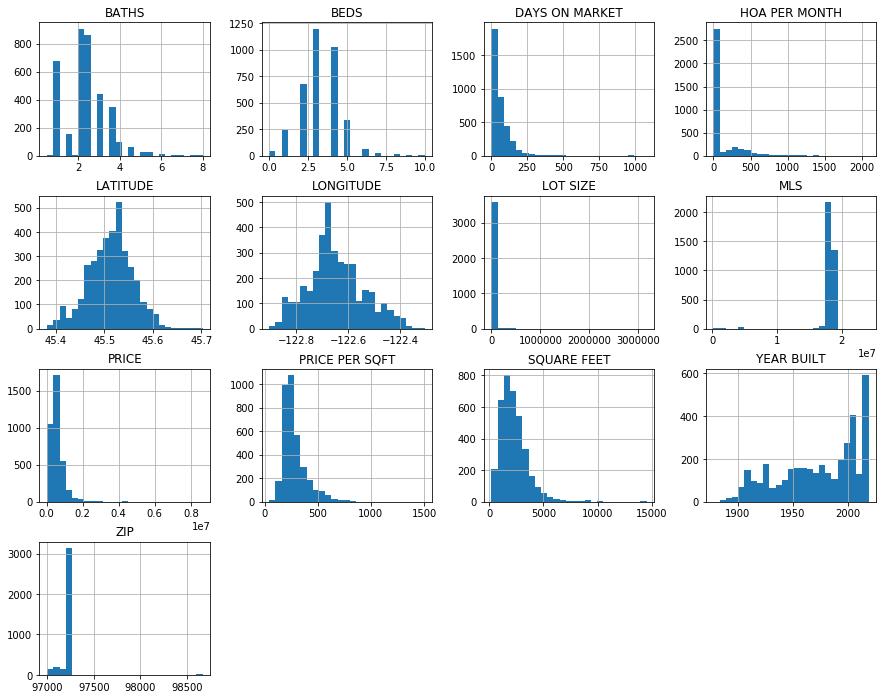

In [46]:
ax_list = prop_df.hist(bins=25, layout=(4,4), figsize=(15,12))

Explore the frequency of categorical columns

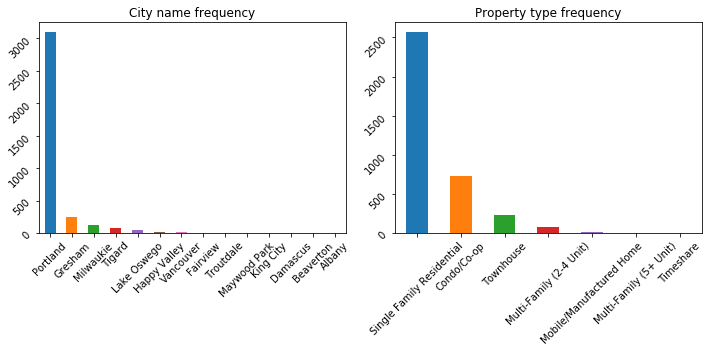

In [47]:
fig2, ax2 = plt.subplots(1,2, figsize=(10,5))

prop_df['CITY'].value_counts().plot(kind='bar', ax=ax2[0], 
                                             title='City name frequency')
ax2[0].tick_params(labelrotation=45)

prop_df['PROPERTY TYPE'].value_counts().plot(kind='bar', ax=ax2[1], 
                                             title='Property type frequency')
ax2[1].tick_params(labelrotation=45)
plt.tight_layout()

## Filter based on your criteria
Let us define a few rules based on the intrinsic properties of these houses and shortlist them.

In [48]:
filtered_df = prop_sdf[(prop_df['BEDS']>=2) & 
                       (prop_df['BATHS']>1)& 
                       (prop_df['HOA PER MONTH']<=200) & 
                       (prop_df['YEAR BUILT']>=2000) & 
                       (prop_df['SQUARE FEET'] > 2000) & 
                       (prop_df['PRICE']<=700000)]
filtered_df.shape

(331, 23)

In [49]:
(prop_sdf.shape, filtered_df.shape)

((3624, 23), (331, 23))

From `3624` houses, we shortlisted `331` of them. Below, let us visualize the statistical distribution of this shortlist.

### Visualize statistical distribution of shortlisted properties

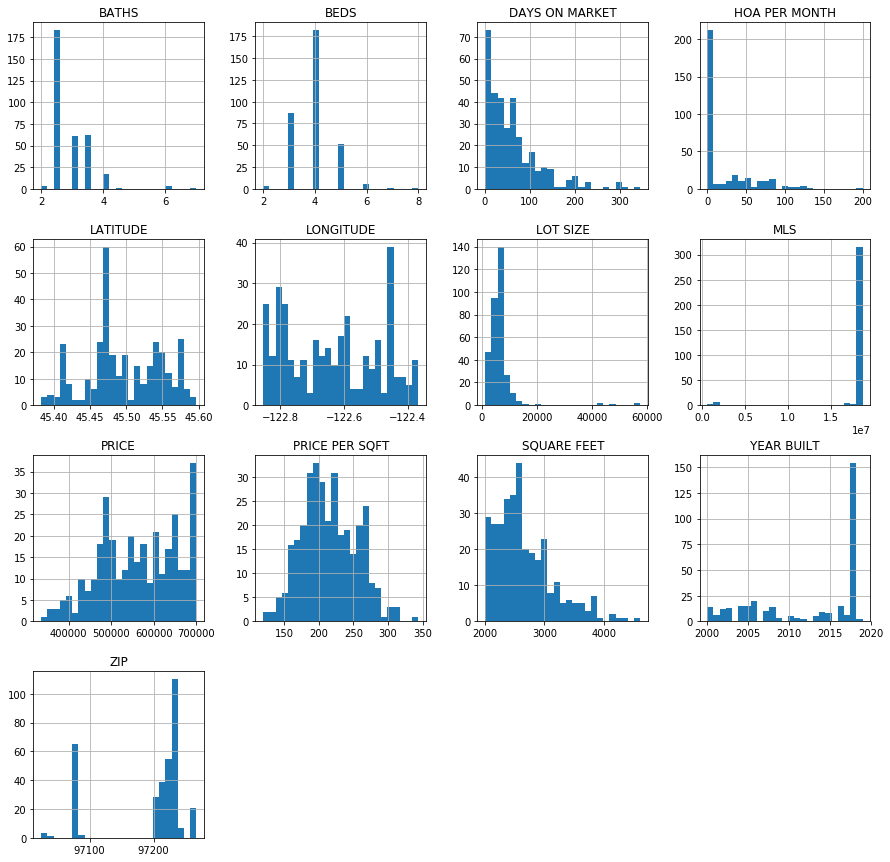

In [50]:
ax_list2 = filtered_df.hist(bins=25, layout=(4,4), figsize=(15,15))

From the histograms above, we notice most of the houses have `4` beds, while we requested for at least `2`. Majority of them are newly built and skewed toward upper end of the price spectrum.

### Visualize spatial distribution of shortlisted properties

In [ ]:
pdx_filtered_map = gis.map("Portland, OR")
pdx_filtered_map.basemap = 'gray-vector'
pdx_filtered_map

![](/images/portland-map7.png)

In [ ]:
filtered_df.spatial.plot(map_widget=pdx_filtered_map, 
                         renderer_type='c',
                         method='esriClassifyNaturalBreaks',  # classification scheme
                         class_count=10,
                         col='PRICE',
                         cmap='Blues',  # matplotlib color map
                        alpha=0.7,outline_color=[0,0,0,0])

The houses in the shortlist are well spread across the Portland market. We notice spatial clustering in the distribution of property prices. Higher priced houses are mostly to the west of downtown while moderately and lower priced are spread across east and south.

### Write the shortlisted properties to disk
So far, we used attribute queries to explore and filter out properties. We have not yet used GIS analysis to narrow them further. Before that, let us save our work to disk.

In [53]:
filtered_df.to_csv('resources/houses_for_sale_att_filtered.csv')